In [ ]:
import matplotlib.pyplot as plt
import numpy as np

from keras.datasets import mnist
from keras.layers import Activation, BatchNormalization, Dense, Dropout, Flatten, Reshape
from keras.layers import LeakyReLU
from keras.layers.convolutional import Conv2D, Conv2DTranspose
from keras.models import Sequential
from keras.optimizers import Adam

In [ ]:
img_rows = 28
img_cols = 28
channels = 1

# Input image dimensions
img_shape = (img_rows, img_cols, channels)

# Size of the noise vector, used as input to the Generator
z_dim = 100
z_dim2 = 200
z_dim3 = 500
z_dim4 = 1024

a=[]
l=[]

d = [z_dim, z_dim2, z_dim3, z_dim4]

#Generator

In [ ]:
def build_generator(z_dim):

    model = Sequential()

    # Reshape input into 7x7x256 tensor via a fully connected layer
    model.add(Dense(256 * 7 * 7, input_dim=z_dim))
    model.add(Reshape((7, 7, 256)))

    # Transposed convolution layer, from 7x7x256 into 14x14x128 tensor
    model.add(Conv2DTranspose(128, kernel_size=3, strides=2, padding='same'))

    # Batch normalization
    model.add(BatchNormalization())

    # Leaky ReLU activation
    model.add(LeakyReLU(alpha=0.01))

    # Transposed convolution layer, from 14x14x128 to 14x14x64 tensor
    model.add(Conv2DTranspose(64, kernel_size=3, strides=1, padding='same'))

    # Batch normalization
    model.add(BatchNormalization())

    # Leaky ReLU activation
    model.add(LeakyReLU(alpha=0.01))

    # Transposed convolution layer, from 14x14x64 to 28x28x1 tensor
    model.add(Conv2DTranspose(1, kernel_size=3, strides=2, padding='same'))

    # Output layer with tanh activation
    model.add(Activation('tanh'))

    return model

# Discriminator


In [ ]:
def build_discriminator(img_shape):

    model = Sequential()

    # Convolutional layer, from 28x28x1 into 14x14x32 tensor
    model.add(
        Conv2D(32,
               kernel_size=3,
               strides=2,
               input_shape=img_shape,
               padding='same'))

    # Leaky ReLU activation
    model.add(LeakyReLU(alpha=0.01))

    # Convolutional layer, from 14x14x32 into 7x7x64 tensor
    model.add(
        Conv2D(64,
               kernel_size=3,
               strides=2,
               input_shape=img_shape,
               padding='same'))

    # Batch normalization
    model.add(BatchNormalization())

    # Leaky ReLU activation
    model.add(LeakyReLU(alpha=0.01))

    # Convolutional layer, from 7x7x64 tensor into 3x3x128 tensor
    model.add(
        Conv2D(128,
               kernel_size=3,
               strides=2,
               input_shape=img_shape,
               padding='same'))

    # Batch normalization
    model.add(BatchNormalization())

    # Leaky ReLU activation
    model.add(LeakyReLU(alpha=0.01))

    # Output layer with sigmoid activation
    model.add(Flatten())
    model.add(Dense(1, activation='sigmoid'))

    return model

# GAN

In [ ]:
def build_gan(generator, discriminator):

    model = Sequential()

    # Combined Generator -> Discriminator model
    model.add(generator)
    model.add(discriminator)

    return model

# z_dim = 100

In [ ]:
# Build and compile the Discriminator
discriminator1 = build_discriminator(img_shape)
discriminator1.compile(loss='binary_crossentropy',
                      optimizer=Adam(),
                      metrics=['accuracy'])

# Build the Generator
generator1 = build_generator(z_dim)

# Keep Discriminator’s parameters constant for Generator training
discriminator1.trainable = False

# Build and compile GAN model with fixed Discriminator to train the Generator
gan = build_gan(generator1, discriminator1)
gan.compile(loss='binary_crossentropy', optimizer=Adam())

In [ ]:
losses1 = []
accuracies1 = []
iteration_checkpoints = []


def train1(iterations, batch_size, sample_interval):

    # Load the MNIST dataset
    (X_train, _), (_, _) = mnist.load_data()

    # Rescale [0, 255] grayscale pixel values to [-1, 1]
    X_train = X_train / 127.5 - 1.0
    X_train = np.expand_dims(X_train, axis=3)

    # Labels for real images: all ones
    real = np.ones((batch_size, 1))

    # Labels for fake images: all zeros
    fake = np.zeros((batch_size, 1))

    for iteration in range(iterations):

        # -------------------------
        #  Train the Discriminator
        # -------------------------

        # Get a random batch of real images
        idx = np.random.randint(0, X_train.shape[0], batch_size)
        imgs = X_train[idx]

        # Generate a batch of fake images
        z = np.random.normal(0, 1, (batch_size, 100))
        gen_imgs = generator1.predict(z)

        # Train Discriminator
        d_loss_real = discriminator1.train_on_batch(imgs, real)
        d_loss_fake = discriminator1.train_on_batch(gen_imgs, fake)
        d_loss, accuracy = 0.5 * np.add(d_loss_real, d_loss_fake)

        # ---------------------
        #  Train the Generator
        # ---------------------

        # Generate a batch of fake images
        z = np.random.normal(0, 1, (batch_size, 100))
        gen_imgs = generator1.predict(z)

        # Train Generator
        g_loss = gan.train_on_batch(z, real)

        if (iteration + 1) % sample_interval == 0:

            # Save losses and accuracies so they can be plotted after training
            losses1.append((d_loss, g_loss))
            accuracies1.append(100.0 * accuracy)
            iteration_checkpoints.append(iteration + 1)

            # Output training progress
            print("%d [D loss: %f, acc.: %.2f%%] [G loss: %f]" %
                  (iteration + 1, d_loss, 100.0 * accuracy, g_loss))

            # Output a sample of generated image
            sample_images1(generator1)

In [ ]:
def sample_images1(generator, image_grid_rows=4, image_grid_columns=4):

    # Sample random noise
    z = np.random.normal(0, 1, (image_grid_rows * image_grid_columns, z_dim))

    # Generate images from random noise
    gen_imgs = generator.predict(z)

    # Rescale image pixel values to [0, 1]
    gen_imgs = 0.5 * gen_imgs + 0.5

    # Set image grid
    fig, axs = plt.subplots(image_grid_rows,
                            image_grid_columns,
                            figsize=(4, 4),
                            sharey=True,
                            sharex=True)

    cnt = 0
    for i in range(image_grid_rows):
        for j in range(image_grid_columns):
            # Output a grid of images
            axs[i, j].imshow(gen_imgs[cnt, :, :, 0], cmap='gray')
            axs[i, j].axis('off')
            cnt += 1

4/4 [==============================] - 0s 94ms/step
50 [D loss: 0.004368, acc.: 100.00%] [G loss: 0.692010]
4/4 [==============================] - 1s 140ms/step
100 [D loss: 0.000416, acc.: 100.00%] [G loss: 0.086791]
4/4 [==============================] - 0s 84ms/step
150 [D loss: 0.000110, acc.: 100.00%] [G loss: 0.004929]
4/4 [==============================] - 0s 89ms/step
200 [D loss: 0.000095, acc.: 100.00%] [G loss: 0.000555]
4/4 [==============================] - 0s 89ms/step
250 [D loss: 0.000119, acc.: 100.00%] [G loss: 0.000961]
4/4 [==============================] - 0s 88ms/step
300 [D loss: 0.000160, acc.: 100.00%] [G loss: 0.003997]
4/4 [==============================] - 0s 87ms/step
350 [D loss: 0.000168, acc.: 100.00%] [G loss: 0.003646]
4/4 [==============================] - 0s 88ms/step
400 [D loss: 0.000098, acc.: 100.00%] [G loss: 0.002684]
4/4 [==============================] - 0s 90ms/step
450 [D loss: 0.000111, acc.: 100.00%] [G loss: 0.004857]
4/4 [==============

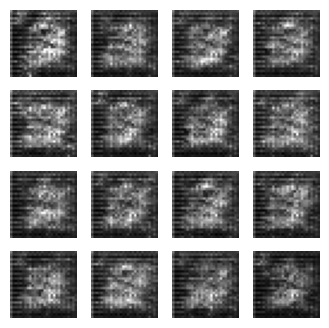

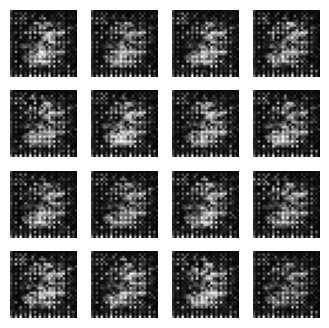

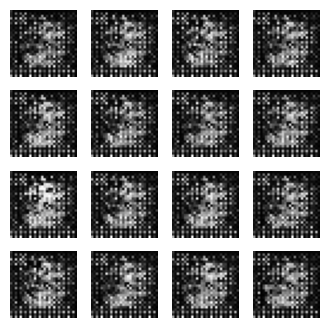

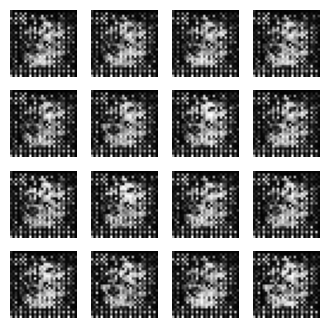

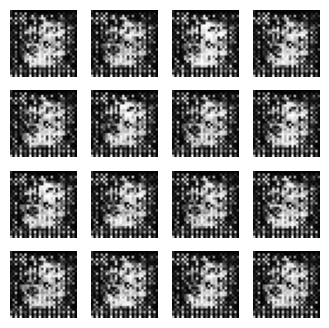

...

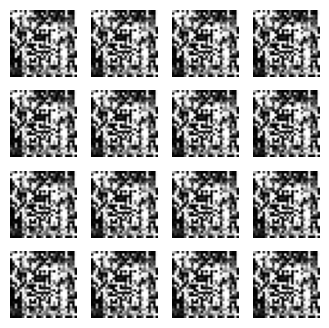

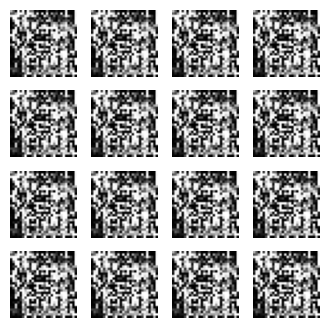

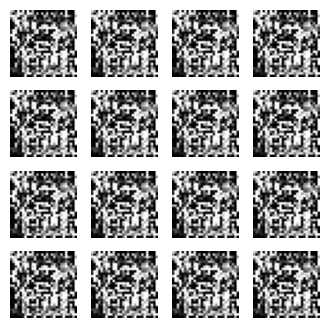

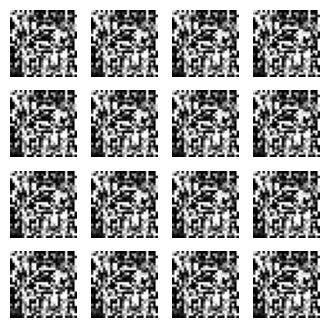

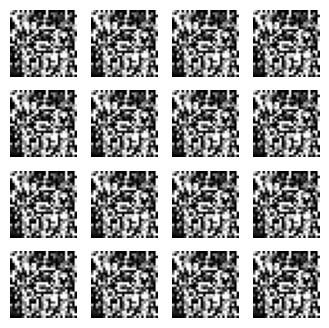

In [ ]:
# Set hyperparameters
iterations = 1000
batch_size = 128
sample_interval = 50

# Train the DCGAN for the specified number of iterations
train1(iterations, batch_size, sample_interval)

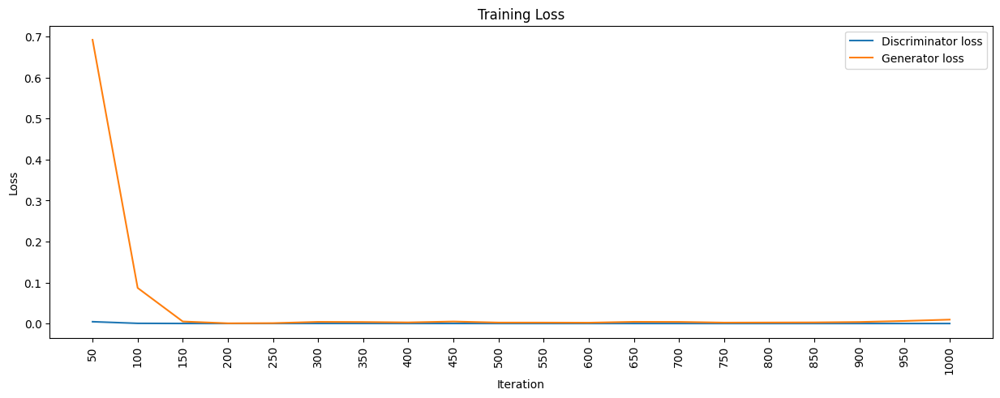

In [ ]:
losses1 = np.array(losses1)

# Plot training losses for Discriminator and Generator
plt.figure(figsize=(15, 5))
plt.plot(iteration_checkpoints, losses1.T[0], label="Discriminator loss")
plt.plot(iteration_checkpoints, losses1.T[1], label="Generator loss")

plt.xticks(iteration_checkpoints, rotation=90)

plt.title("Training Loss")
plt.xlabel("Iteration")
plt.ylabel("Loss")
plt.legend()

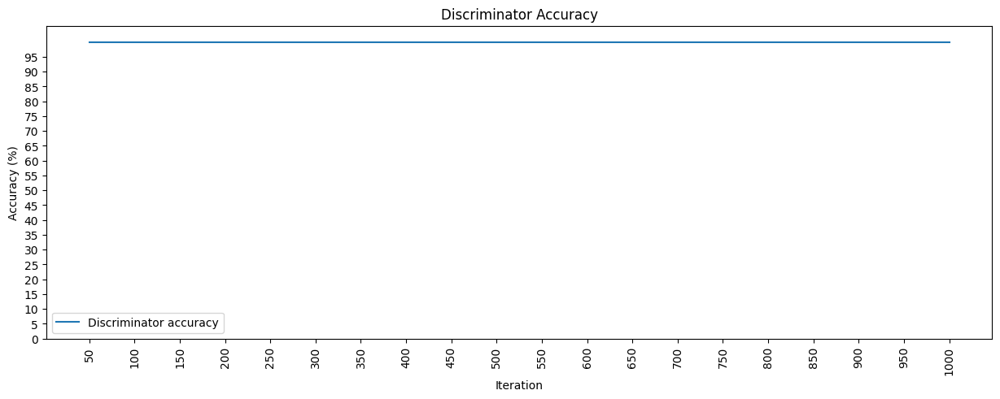

In [ ]:
accuracies1 = np.array(accuracies1)

# Plot Discriminator accuracy
plt.figure(figsize=(15, 5))
plt.plot(iteration_checkpoints, accuracies1, label="Discriminator accuracy")

plt.xticks(iteration_checkpoints, rotation=90)
plt.yticks(range(0, 100, 5))

plt.title("Discriminator Accuracy")
plt.xlabel("Iteration")
plt.ylabel("Accuracy (%)")
plt.legend()

In [ ]:
a1 = np.mean(accuracies1)
l1 = np.mean(losses1)

a.append(a1)
l.append(l1)

# z_dim = 200

In [ ]:
# Build and compile the Discriminator
discriminator2 = build_discriminator(img_shape)
discriminator2.compile(loss='binary_crossentropy',
                      optimizer=Adam(),
                      metrics=['accuracy'])

# Build the Generator
generator2 = build_generator(z_dim2)

# Keep Discriminator’s parameters constant for Generator training
discriminator2.trainable = False

# Build and compile GAN model with fixed Discriminator to train the Generator
gan = build_gan(generator2, discriminator2)
gan.compile(loss='binary_crossentropy', optimizer=Adam())

In [ ]:
losses2 = []
accuracies2 = []
iteration_checkpoints = []


def train2(iterations, batch_size, sample_interval):

    # Load the MNIST dataset
    (X_train, _), (_, _) = mnist.load_data()

    # Rescale [0, 255] grayscale pixel values to [-1, 1]
    X_train = X_train / 127.5 - 1.0
    X_train = np.expand_dims(X_train, axis=3)

    # Labels for real images: all ones
    real = np.ones((batch_size, 1))

    # Labels for fake images: all zeros
    fake = np.zeros((batch_size, 1))

    for iteration in range(iterations):

        # -------------------------
        #  Train the Discriminator
        # -------------------------

        # Get a random batch of real images
        idx = np.random.randint(0, X_train.shape[0], batch_size)
        imgs = X_train[idx]

        # Generate a batch of fake images
        z = np.random.normal(0, 1, (batch_size, 200))
        gen_imgs = generator2.predict(z)

        # Train Discriminator
        d_loss_real = discriminator2.train_on_batch(imgs, real)
        d_loss_fake = discriminator2.train_on_batch(gen_imgs, fake)
        d_loss, accuracy = 0.5 * np.add(d_loss_real, d_loss_fake)

        # ---------------------
        #  Train the Generator
        # ---------------------

        # Generate a batch of fake images
        z = np.random.normal(0, 1, (batch_size, 200))
        gen_imgs = generator2.predict(z)

        # Train Generator
        g_loss = gan.train_on_batch(z, real)

        if (iteration + 1) % sample_interval == 0:

            # Save losses and accuracies so they can be plotted after training
            losses2.append((d_loss, g_loss))
            accuracies2.append(100.0 * accuracy)
            iteration_checkpoints.append(iteration + 1)

            # Output training progress
            print("%d [D loss: %f, acc.: %.2f%%] [G loss: %f]" %
                  (iteration + 1, d_loss, 100.0 * accuracy, g_loss))

            # Output a sample of generated image
            sample_images2(generator2)

In [ ]:
def sample_images2(generator, image_grid_rows=4, image_grid_columns=4):

    # Sample random noise
    z = np.random.normal(0, 1, (image_grid_rows * image_grid_columns, z_dim2))

    # Generate images from random noise
    gen_imgs = generator.predict(z)

    # Rescale image pixel values to [0, 1]
    gen_imgs = 0.5 * gen_imgs + 0.5

    # Set image grid
    fig, axs = plt.subplots(image_grid_rows,
                            image_grid_columns,
                            figsize=(4, 4),
                            sharey=True,
                            sharex=True)

    cnt = 0
    for i in range(image_grid_rows):
        for j in range(image_grid_columns):
            # Output a grid of images
            axs[i, j].imshow(gen_imgs[cnt, :, :, 0], cmap='gray')
            axs[i, j].axis('off')
            cnt += 1

4/4 [==============================] - 0s 88ms/step
50 [D loss: 0.019865, acc.: 100.00%] [G loss: 1.003384]
4/4 [==============================] - 0s 99ms/step
100 [D loss: 0.003681, acc.: 100.00%] [G loss: 0.196456]
4/4 [==============================] - 0s 93ms/step
150 [D loss: 0.004782, acc.: 100.00%] [G loss: 0.404721]
4/4 [==============================] - 0s 89ms/step
200 [D loss: 0.007237, acc.: 100.00%] [G loss: 0.576534]
4/4 [==============================] - 0s 96ms/step
250 [D loss: 0.001338, acc.: 100.00%] [G loss: 0.167709]
4/4 [==============================] - 0s 89ms/step
300 [D loss: 0.000320, acc.: 100.00%] [G loss: 0.049857]
4/4 [==============================] - 0s 93ms/step
350 [D loss: 0.000533, acc.: 100.00%] [G loss: 0.049879]
4/4 [==============================] - 0s 100ms/step
400 [D loss: 0.000209, acc.: 100.00%] [G loss: 0.018915]
4/4 [==============================] - 0s 92ms/step
450 [D loss: 0.000131, acc.: 100.00%] [G loss: 0.009738]
4/4 [==============

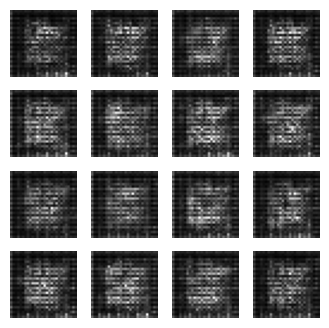

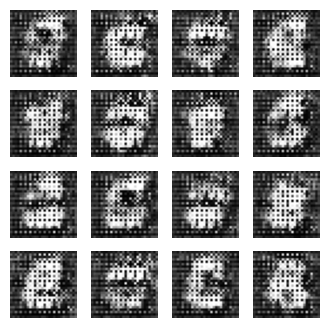

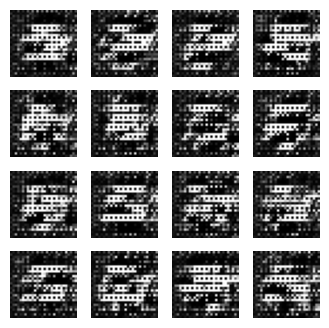

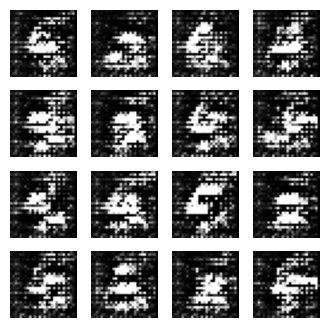

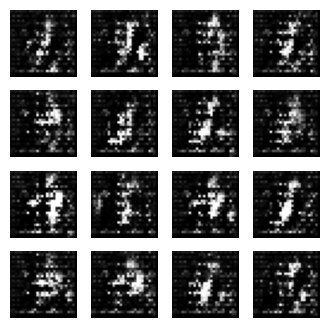

...

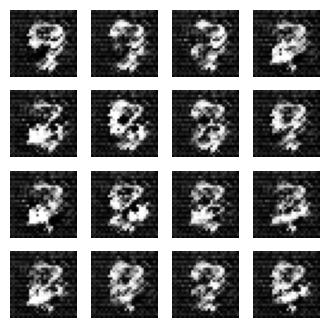

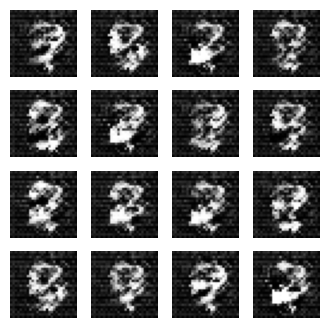

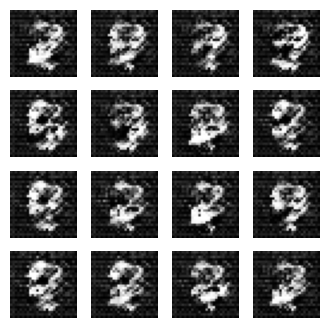

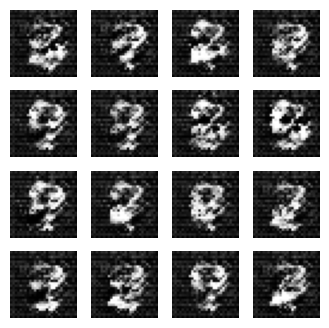

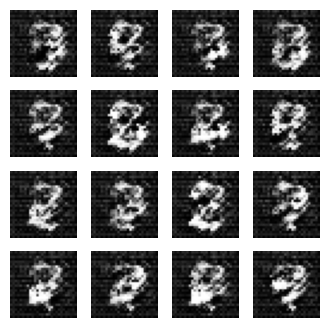

In [ ]:
# Set hyperparameters
iterations = 1000
batch_size = 128
sample_interval = 50

# Train the DCGAN for the specified number of iterations
train2(iterations, batch_size, sample_interval)

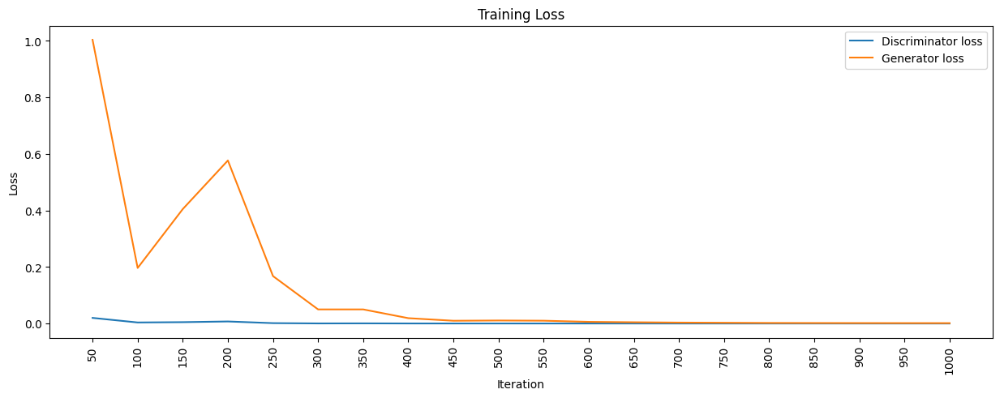

In [ ]:
losses2 = np.array(losses2)

# Plot training losses for Discriminator and Generator
plt.figure(figsize=(15, 5))
plt.plot(iteration_checkpoints, losses2.T[0], label="Discriminator loss")
plt.plot(iteration_checkpoints, losses2.T[1], label="Generator loss")

plt.xticks(iteration_checkpoints, rotation=90)

plt.title("Training Loss")
plt.xlabel("Iteration")
plt.ylabel("Loss")
plt.legend()

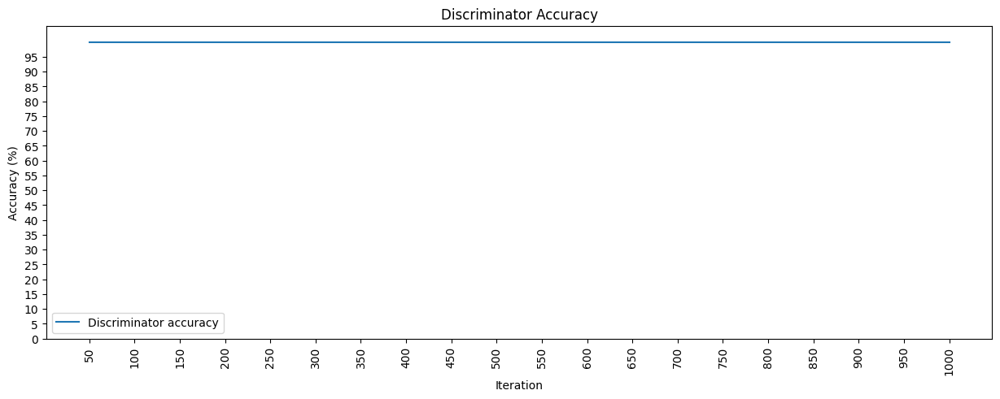

In [ ]:
accuracies2 = np.array(accuracies2)

# Plot Discriminator accuracy
plt.figure(figsize=(15, 5))
plt.plot(iteration_checkpoints, accuracies2, label="Discriminator accuracy")

plt.xticks(iteration_checkpoints, rotation=90)
plt.yticks(range(0, 100, 5))

plt.title("Discriminator Accuracy")
plt.xlabel("Iteration")
plt.ylabel("Accuracy (%)")
plt.legend()

In [ ]:
a2 = np.mean(accuracies2)
l2 = np.mean(losses2)

a.append(a2)
l.append(l2)

# z_dim = 500

In [ ]:
# Build and compile the Discriminator
discriminator3 = build_discriminator(img_shape)
discriminator3.compile(loss='binary_crossentropy',
                      optimizer=Adam(),
                      metrics=['accuracy'])

# Build the Generator
generator3 = build_generator(z_dim3)

# Keep Discriminator’s parameters constant for Generator training
discriminator3.trainable = False

# Build and compile GAN model with fixed Discriminator to train the Generator
gan = build_gan(generator3, discriminator3)
gan.compile(loss='binary_crossentropy', optimizer=Adam())

In [ ]:
losses3 = []
accuracies3 = []
iteration_checkpoints = []


def train3(iterations, batch_size, sample_interval):

    # Load the MNIST dataset
    (X_train, _), (_, _) = mnist.load_data()

    # Rescale [0, 255] grayscale pixel values to [-1, 1]
    X_train = X_train / 127.5 - 1.0
    X_train = np.expand_dims(X_train, axis=3)

    # Labels for real images: all ones
    real = np.ones((batch_size, 1))

    # Labels for fake images: all zeros
    fake = np.zeros((batch_size, 1))

    for iteration in range(iterations):

        # -------------------------
        #  Train the Discriminator
        # -------------------------

        # Get a random batch of real images
        idx = np.random.randint(0, X_train.shape[0], batch_size)
        imgs = X_train[idx]

        # Generate a batch of fake images
        z = np.random.normal(0, 1, (batch_size, 500))
        gen_imgs = generator3.predict(z)

        # Train Discriminator
        d_loss_real = discriminator3.train_on_batch(imgs, real)
        d_loss_fake = discriminator3.train_on_batch(gen_imgs, fake)
        d_loss, accuracy = 0.5 * np.add(d_loss_real, d_loss_fake)

        # ---------------------
        #  Train the Generator
        # ---------------------

        # Generate a batch of fake images
        z = np.random.normal(0, 1, (batch_size, 500))
        gen_imgs = generator3.predict(z)

        # Train Generator
        g_loss = gan.train_on_batch(z, real)

        if (iteration + 1) % sample_interval == 0:

            # Save losses and accuracies so they can be plotted after training
            losses3.append((d_loss, g_loss))
            accuracies3.append(100.0 * accuracy)
            iteration_checkpoints.append(iteration + 1)

            # Output training progress
            print("%d [D loss: %f, acc.: %.2f%%] [G loss: %f]" %
                  (iteration + 1, d_loss, 100.0 * accuracy, g_loss))

            # Output a sample of generated image
            sample_images3(generator3)

In [ ]:
def sample_images3(generator, image_grid_rows=4, image_grid_columns=4):

    # Sample random noise
    z = np.random.normal(0, 1, (image_grid_rows * image_grid_columns, z_dim3))

    # Generate images from random noise
    gen_imgs = generator.predict(z)

    # Rescale image pixel values to [0, 1]
    gen_imgs = 0.5 * gen_imgs + 0.5

    # Set image grid
    fig, axs = plt.subplots(image_grid_rows,
                            image_grid_columns,
                            figsize=(4, 4),
                            sharey=True,
                            sharex=True)

    cnt = 0
    for i in range(image_grid_rows):
        for j in range(image_grid_columns):
            # Output a grid of images
            axs[i, j].imshow(gen_imgs[cnt, :, :, 0], cmap='gray')
            axs[i, j].axis('off')
            cnt += 1

4/4 [==============================] - 0s 97ms/step
50 [D loss: 0.004384, acc.: 100.00%] [G loss: 0.498802]
4/4 [==============================] - 1s 158ms/step
100 [D loss: 0.009553, acc.: 100.00%] [G loss: 1.303116]
4/4 [==============================] - 1s 151ms/step
150 [D loss: 0.000727, acc.: 100.00%] [G loss: 0.746772]
4/4 [==============================] - 0s 102ms/step
200 [D loss: 0.000216, acc.: 100.00%] [G loss: 0.195623]
4/4 [==============================] - 0s 95ms/step
250 [D loss: 0.000440, acc.: 100.00%] [G loss: 0.104151]
4/4 [==============================] - 0s 96ms/step
300 [D loss: 0.000296, acc.: 100.00%] [G loss: 0.067538]
4/4 [==============================] - 0s 97ms/step
350 [D loss: 0.000131, acc.: 100.00%] [G loss: 0.013791]
4/4 [==============================] - 0s 98ms/step
400 [D loss: 0.000051, acc.: 100.00%] [G loss: 0.005670]
4/4 [==============================] - 0s 102ms/step
450 [D loss: 0.000051, acc.: 100.00%] [G loss: 0.002862]
4/4 [===========

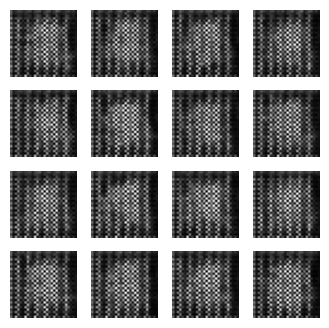

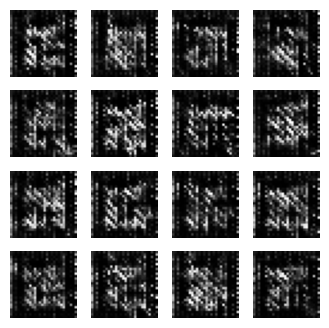

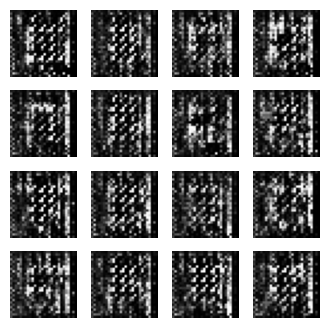

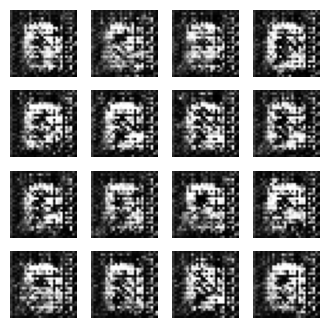

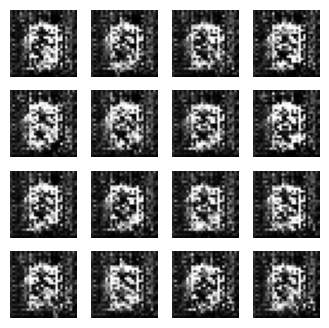

...

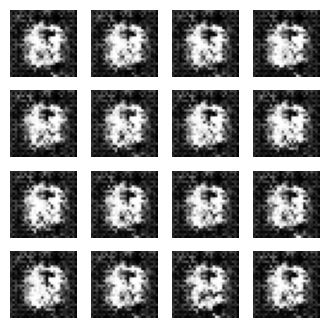

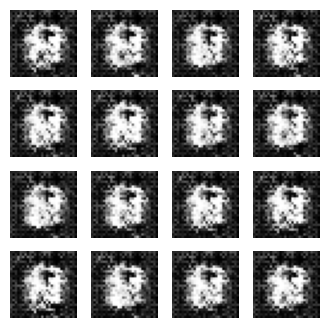

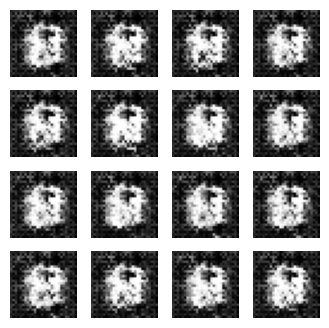

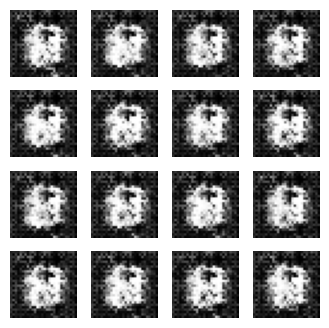

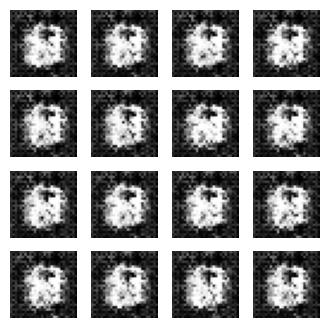

In [ ]:
# Set hyperparameters
iterations = 1000
batch_size = 128
sample_interval = 50

# Train the DCGAN for the specified number of iterations
train3(iterations, batch_size, sample_interval)

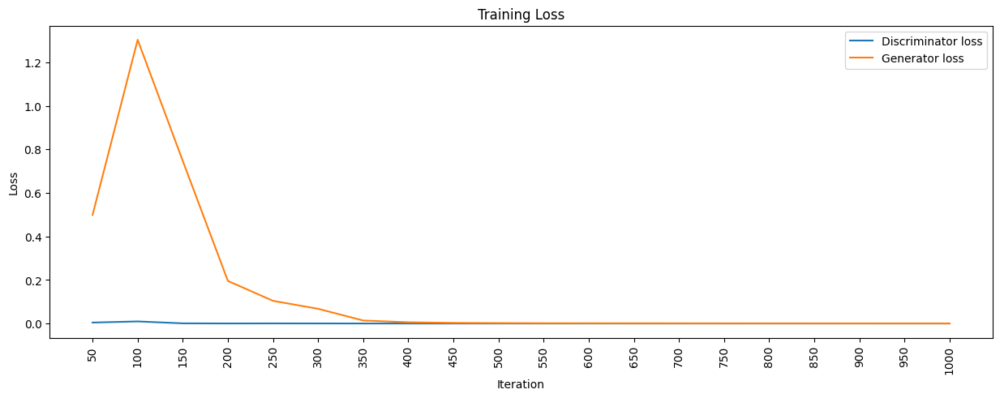

In [ ]:
losses3 = np.array(losses3)

# Plot training losses for Discriminator and Generator
plt.figure(figsize=(15, 5))
plt.plot(iteration_checkpoints, losses3.T[0], label="Discriminator loss")
plt.plot(iteration_checkpoints, losses3.T[1], label="Generator loss")

plt.xticks(iteration_checkpoints, rotation=90)

plt.title("Training Loss")
plt.xlabel("Iteration")
plt.ylabel("Loss")
plt.legend()

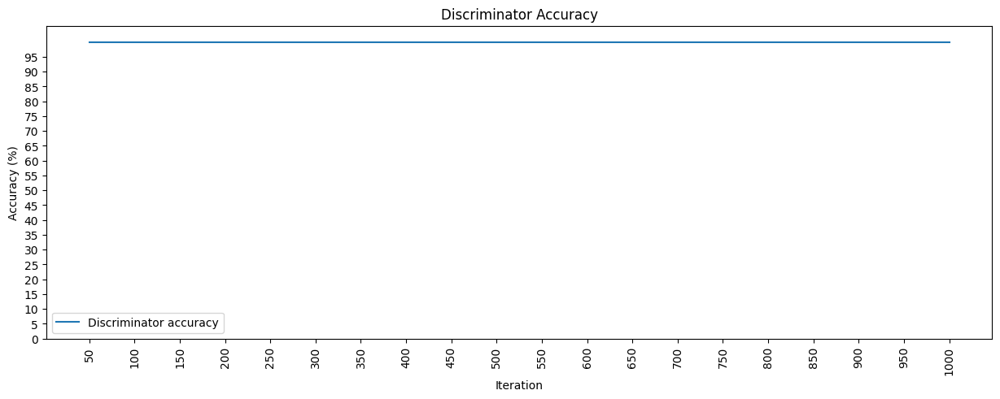

In [ ]:
accuracies3 = np.array(accuracies3)

# Plot Discriminator accuracy
plt.figure(figsize=(15, 5))
plt.plot(iteration_checkpoints, accuracies3, label="Discriminator accuracy")

plt.xticks(iteration_checkpoints, rotation=90)
plt.yticks(range(0, 100, 5))

plt.title("Discriminator Accuracy")
plt.xlabel("Iteration")
plt.ylabel("Accuracy (%)")
plt.legend()

In [ ]:
a3 = np.mean(accuracies3)
l3 = np.mean(losses3)

a.append(a3)
l.append(l3)

# z_dim = 1024

In [ ]:
# Build and compile the Discriminator
discriminator4 = build_discriminator(img_shape)
discriminator4.compile(loss='binary_crossentropy',
                      optimizer=Adam(),
                      metrics=['accuracy'])

# Build the Generator
generator4 = build_generator(z_dim4)

# Keep Discriminator’s parameters constant for Generator training
discriminator4.trainable = False

# Build and compile GAN model with fixed Discriminator to train the Generator
gan = build_gan(generator4, discriminator4)
gan.compile(loss='binary_crossentropy', optimizer=Adam())

In [ ]:
losses4 = []
accuracies4 = []
iteration_checkpoints = []


def train4(iterations, batch_size, sample_interval):

    # Load the MNIST dataset
    (X_train, _), (_, _) = mnist.load_data()

    # Rescale [0, 255] grayscale pixel values to [-1, 1]
    X_train = X_train / 127.5 - 1.0
    X_train = np.expand_dims(X_train, axis=3)

    # Labels for real images: all ones
    real = np.ones((batch_size, 1))

    # Labels for fake images: all zeros
    fake = np.zeros((batch_size, 1))

    for iteration in range(iterations):

        # -------------------------
        #  Train the Discriminator
        # -------------------------

        # Get a random batch of real images
        idx = np.random.randint(0, X_train.shape[0], batch_size)
        imgs = X_train[idx]

        # Generate a batch of fake images
        z = np.random.normal(0, 1, (batch_size, 1024))
        gen_imgs = generator4.predict(z)

        # Train Discriminator
        d_loss_real = discriminator4.train_on_batch(imgs, real)
        d_loss_fake = discriminator4.train_on_batch(gen_imgs, fake)
        d_loss, accuracy = 0.5 * np.add(d_loss_real, d_loss_fake)

        # ---------------------
        #  Train the Generator
        # ---------------------

        # Generate a batch of fake images
        z = np.random.normal(0, 1, (batch_size, 1024))
        gen_imgs = generator4.predict(z)

        # Train Generator
        g_loss = gan.train_on_batch(z, real)

        if (iteration + 1) % sample_interval == 0:

            # Save losses and accuracies so they can be plotted after training
            losses4.append((d_loss, g_loss))
            accuracies4.append(100.0 * accuracy)
            iteration_checkpoints.append(iteration + 1)

            # Output training progress
            print("%d [D loss: %f, acc.: %.2f%%] [G loss: %f]" %
                  (iteration + 1, d_loss, 100.0 * accuracy, g_loss))

            # Output a sample of generated image
            sample_images4(generator4)

In [ ]:
def sample_images4(generator, image_grid_rows=4, image_grid_columns=4):

    # Sample random noise
    z = np.random.normal(0, 1, (image_grid_rows * image_grid_columns, z_dim4))

    # Generate images from random noise
    gen_imgs = generator.predict(z)

    # Rescale image pixel values to [0, 1]
    gen_imgs = 0.5 * gen_imgs + 0.5

    # Set image grid
    fig, axs = plt.subplots(image_grid_rows,
                            image_grid_columns,
                            figsize=(4, 4),
                            sharey=True,
                            sharex=True)

    cnt = 0
    for i in range(image_grid_rows):
        for j in range(image_grid_columns):
            # Output a grid of images
            axs[i, j].imshow(gen_imgs[cnt, :, :, 0], cmap='gray')
            axs[i, j].axis('off')
            cnt += 1

4/4 [==============================] - 0s 106ms/step
50 [D loss: 0.017854, acc.: 100.00%] [G loss: 0.772828]
4/4 [==============================] - 0s 114ms/step
100 [D loss: 0.001374, acc.: 100.00%] [G loss: 0.818789]
4/4 [==============================] - 1s 175ms/step
150 [D loss: 0.033370, acc.: 99.22%] [G loss: 1.908703]
4/4 [==============================] - 0s 109ms/step
200 [D loss: 0.000742, acc.: 100.00%] [G loss: 0.048722]
4/4 [==============================] - 0s 111ms/step
250 [D loss: 0.001308, acc.: 100.00%] [G loss: 0.088340]
4/4 [==============================] - 0s 107ms/step
300 [D loss: 0.000481, acc.: 100.00%] [G loss: 0.047886]
4/4 [==============================] - 0s 116ms/step
350 [D loss: 0.001473, acc.: 100.00%] [G loss: 0.347170]
4/4 [==============================] - 0s 112ms/step
400 [D loss: 0.000474, acc.: 100.00%] [G loss: 0.069295]
4/4 [==============================] - 0s 112ms/step
450 [D loss: 0.000316, acc.: 100.00%] [G loss: 0.133084]
4/4 [=======

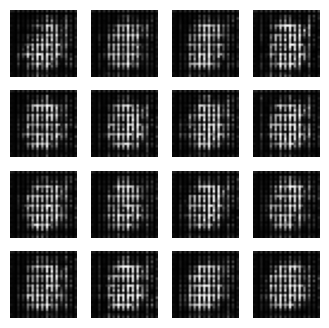

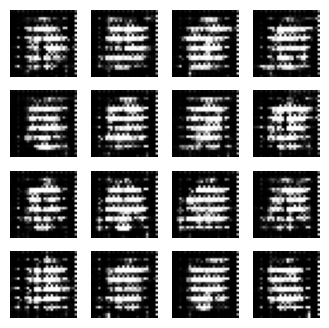

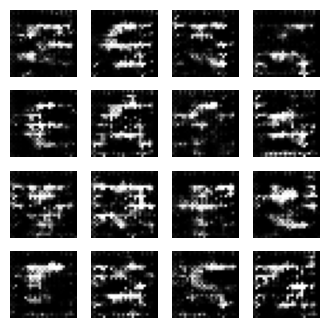

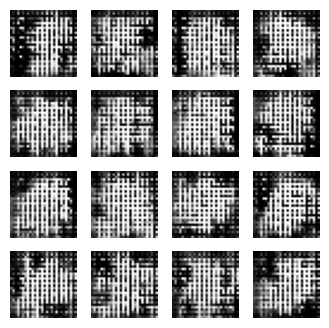

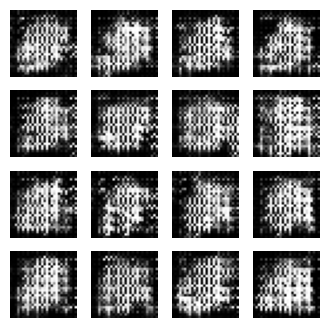

...

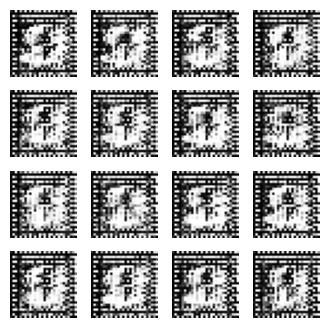

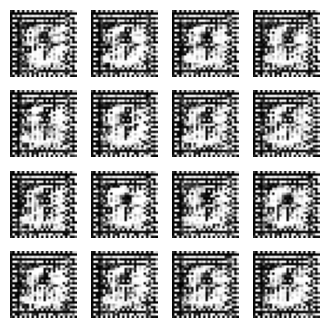

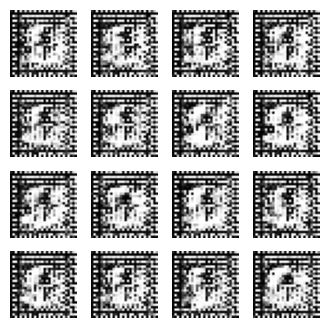

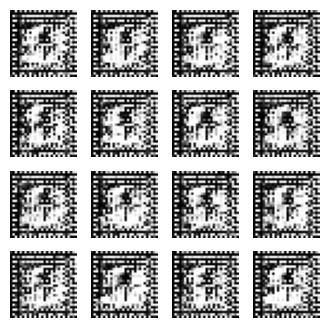

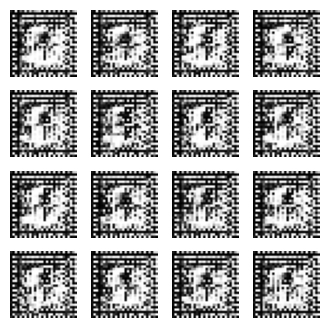

In [ ]:
# Set hyperparameters
iterations = 1000
batch_size = 128
sample_interval = 50

# Train the DCGAN for the specified number of iterations
train4(iterations, batch_size, sample_interval)

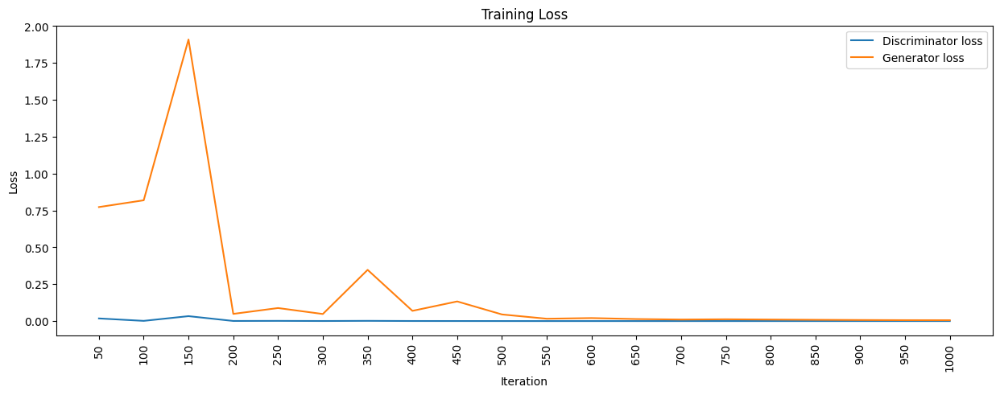

In [ ]:
losses4 = np.array(losses4)

# Plot training losses for Discriminator and Generator
plt.figure(figsize=(15, 5))
plt.plot(iteration_checkpoints, losses4.T[0], label="Discriminator loss")
plt.plot(iteration_checkpoints, losses4.T[1], label="Generator loss")

plt.xticks(iteration_checkpoints, rotation=90)

plt.title("Training Loss")
plt.xlabel("Iteration")
plt.ylabel("Loss")
plt.legend()

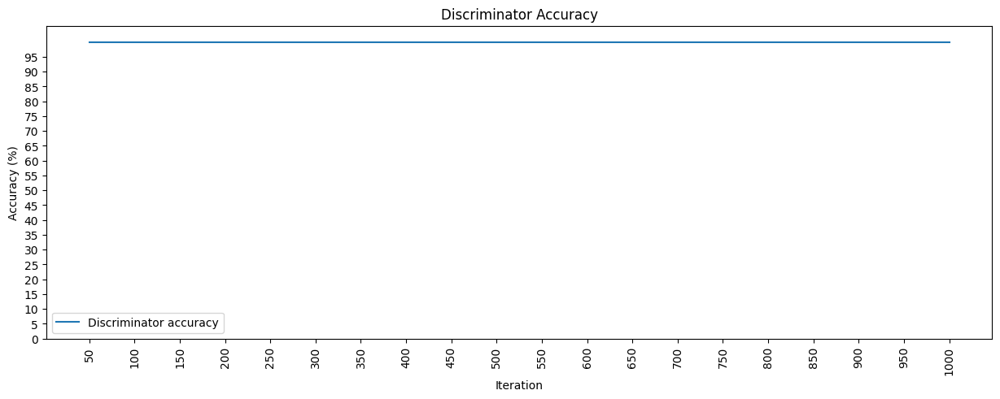

In [ ]:
accuracies4 = np.array(accuracies3)

# Plot Discriminator accuracy
plt.figure(figsize=(15, 5))
plt.plot(iteration_checkpoints, accuracies4, label="Discriminator accuracy")

plt.xticks(iteration_checkpoints, rotation=90)
plt.yticks(range(0, 100, 5))

plt.title("Discriminator Accuracy")
plt.xlabel("Iteration")
plt.ylabel("Accuracy (%)")
plt.legend()

In [ ]:
a4 = np.mean(accuracies4)
l4 = np.mean(losses4)

a.append(a4)
l.append(l4)

# Visualization

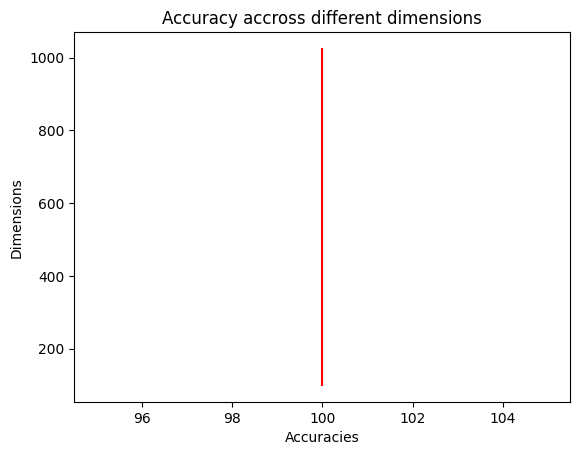

In [ ]:
plt.title("Accuracy accross different dimensions")
plt.xlabel("Accuracies")
plt.ylabel("Dimensions")
plt.plot(a, d, color ="red")
plt.show()

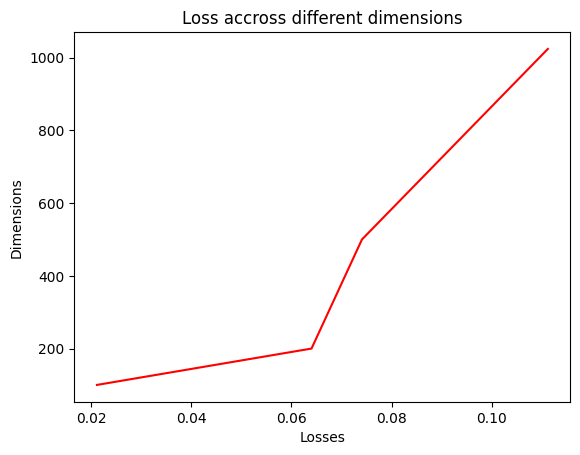

In [ ]:
plt.title("Loss accross different dimensions")
plt.xlabel("Losses")
plt.ylabel("Dimensions")
plt.plot(l, d, color ="red")
plt.show()